# Importation des bibliothèques

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import movingpandas as mpd
from datetime import datetime, timedelta
import plotly.express as px
from shapely.geometry import Point, LineString, Polygon
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter("ignore")

import hvplot.pandas
import cartopy.crs as ccrs

# Lecture des données

In [2]:
fp = "ais.gpkg"
data = gpd.read_file(fp);

In [3]:
data.head()

,Timestamp,MMSI,NavStatus,SOG,COG,Name,ShipType,geometry
0,05/07/2017 00:00:03,219632000,Under way using engine,0.0,270.4,None,Undefined,POINT (11.85958 57.68817)
1,05/07/2017 00:00:05,265650970,Under way using engine,0.0,0.5,None,Undefined,POINT (11.84175 57.66150)
2,05/07/2017 00:00:06,265503900,Under way using engine,0.0,0.0,None,Undefined,POINT (11.90650 57.69077)
3,05/07/2017 00:00:14,219632000,Under way using engine,0.0,188.4,None,Undefined,POINT (11.85958 57.68817)
4,05/07/2017 00:00:19,265519650,Under way using engine,0.0,357.2,None,Undefined,POINT (11.87192 57.68233)


#### MMSI: identifiant unique des navires
#### NavStatus: Statut du navire
#### SOG: Vitesse sur le sol
#### COG: La position du bateau sur le sol


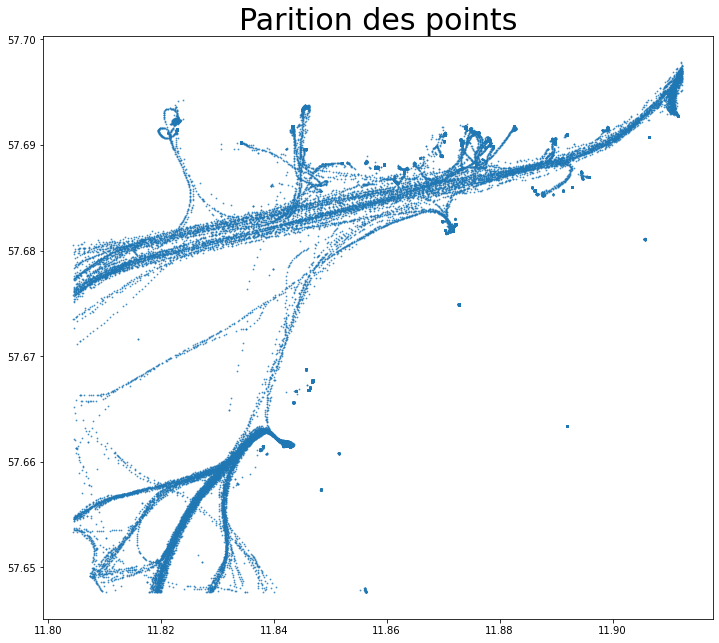

In [4]:
data.plot(figsize=(12,12), markersize=0.7, alpha=0.7)
plt.title("Parition des points",size=30)
plt.show()

In [5]:
data.shape

(84702, 8)

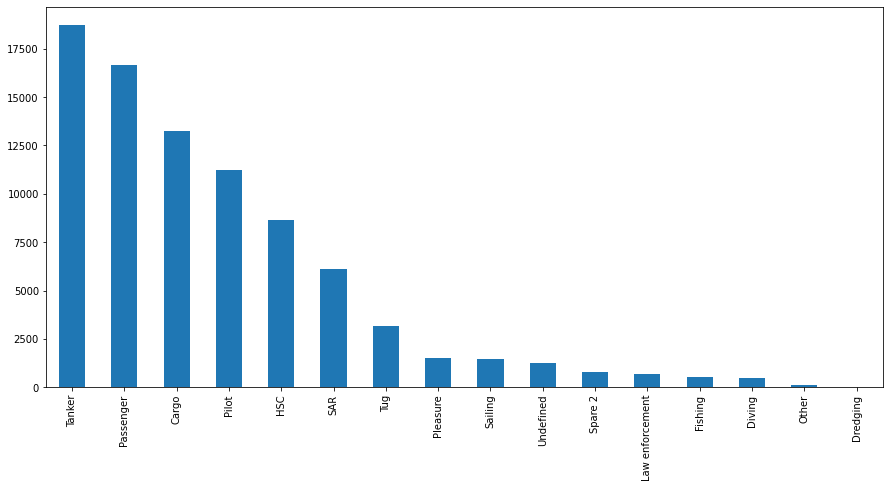

In [6]:
data['ShipType'].value_counts().plot(kind='bar', figsize=(15,7))
plt.show()

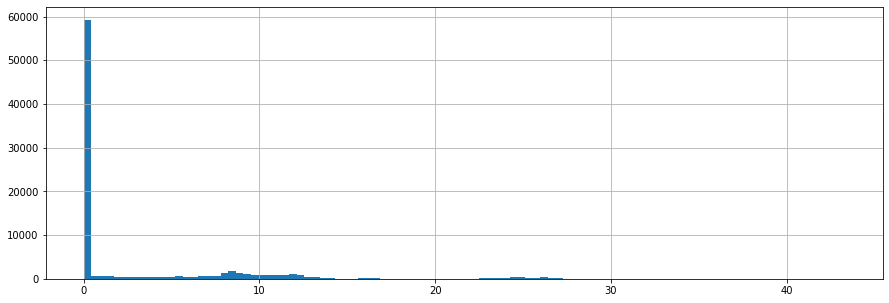

In [7]:
data['SOG'].hist(bins=100, figsize=(15,5))
plt.show()

#### => La  plupart des observations sont en fait telles que les navires n'ont pas bougé, c'est-à-dire qu'ils restent au port.
#### => Il n'est pas utile de conserver de tels enregistrements dans nos données.

In [8]:
#supprimer ddes navires immobiles
data = data[data.SOG>0].copy()
data.shape

(33593, 8)

In [9]:
# Calculer les coordonnées x et y 
data["x"] = data["geometry"].x
data["y"] = data["geometry"].y
data.head()

,Timestamp,MMSI,NavStatus,SOG,COG,Name,ShipType,geometry,x,y
6,05/07/2017 00:00:28,265647200,Moored,0.1,298.0,None,Undefined,POINT (11.89120 57.68569),11.891205,57.685688
7,05/07/2017 00:00:31,265663280,Under way using engine,0.1,131.6,None,Undefined,POINT (11.87037 57.68194),11.870370,57.681937
22,05/07/2017 00:01:03,219632000,Under way using engine,0.1,233.9,None,Undefined,POINT (11.85958 57.68817),11.859583,57.688167
32,05/07/2017 00:01:30,265663280,Under way using engine,0.1,348.6,None,Undefined,POINT (11.87037 57.68194),11.870368,57.681942
85,05/07/2017 00:03:35,376474000,Under way using engine,8.8,229.2,LARGONA,Cargo,POINT (11.91198 57.69591),11.911977,57.695910


# Construire des trajectoires

In [10]:
# créer trajectoires
data['time'] = pd.to_datetime(data['Timestamp'], format='%d/%m/%Y %H:%M:%S')
data = data.set_index('time')

# Spécifier la longueur minimale d'une trajectoire (en mètres)
minimum_length = 100 
collection = mpd.TrajectoryCollection(data, 'MMSI', min_length=minimum_length)

# Qu'avons-nous obtenu ?
collection

TrajectoryCollection with 77 trajectories

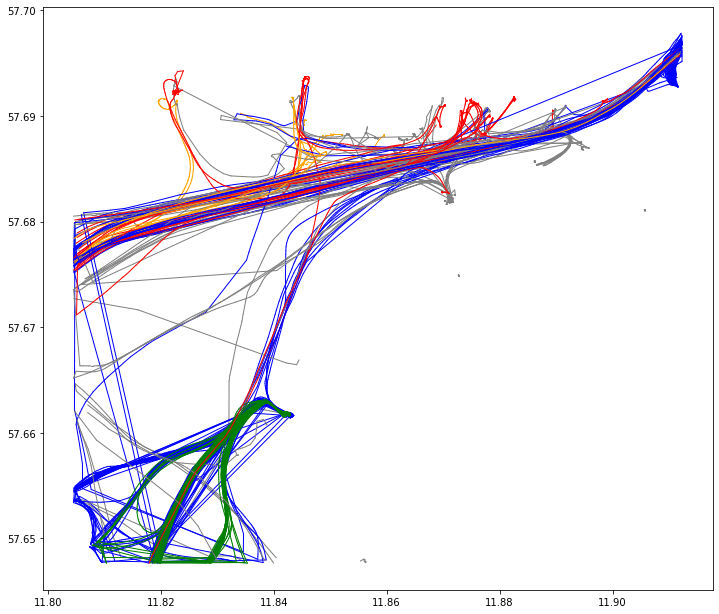

In [11]:
# Tracez toutes les trajectoires
shiptype_to_color = {'Passenger': 'blue', 'HSC': 'green', 'Tanker': 'red', 'Cargo': 'orange', 'Sailing': 'grey', 'Other': 'grey', 
                     'Tug': 'grey', 'SAR': 'grey', 'Undefined': 'grey', 'Pleasure': 'grey', 'Dredging': 'grey', 'Law enforcement': 'grey',
                    'Pilot': 'grey', 'Fishing': 'grey', 'Diving':'grey', 'Spare 2': 'grey'}
collection.plot(column='ShipType', column_to_color=shiptype_to_color, linewidth=1, capstyle='round',figsize=(12,12))
plt.show()

In [12]:
data.hvplot(geo=True, tiles=True, width=800, height=600, line_color="red", project=True,title='Passenger ferries', line_width=2, frame_width=700, frame_height=500)


:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]

# Visualiser les trajectoires selon les types de navires 

In [13]:
data.ShipType.unique()

array(['Undefined', 'Cargo', 'HSC', 'Law enforcement', 'Passenger', 'SAR',
       'Sailing', 'Pilot', 'Tanker', 'Tug', 'Diving', 'Spare 2', 'Other',
       'Fishing', 'Pleasure', 'Dredging'], dtype=object)

In [14]:
passenger=collection.filter('ShipType', 'Passenger')
print(passenger) #Fishing
gdf = gpd.GeoDataFrame(data, geometry=gpd.points_from_xy(data.x, data.y))
# des couleurs différentes pour chaque trajectoire
osm_map_passenger = gdf[gdf['ShipType'] == 'Passenger'].hvplot(geo=True, tiles=True, width=800, height=600, project=True, line_width=2, by='MMSI', cmap='Category10')

# affichage de map
osm_map_passenger


TrajectoryCollection with 14 trajectories


:Overlay
   .Tiles.I     :Tiles   [x,y]
   .NdOverlay.I :NdOverlay   [MMSI]
      :Points   [Longitude,Latitude]

# Visualiser un trajectoire

In [15]:
for trajectory in collection.trajectories:
    # Calculer la vitesse
    trajectory.add_speed(overwrite=True)
    
    # Determiner la direction du movement
    trajectory.add_direction(overwrite=True)
    
    # Vérifions d'abord uniquement la première trajectoire (c'est-à-dire arrêtons l'itération après la première exécution)
    break

In [16]:
trajectory.df.head()

,Timestamp,MMSI,NavStatus,SOG,COG,Name,ShipType,geometry,x,y,speed,direction
time,,,,,,,,,,,,
2017-07-05 17:32:18,05/07/2017 17:32:18,210035000,Under way using engine,9.8,52.8,NORDIC HAMBURG,Cargo,POINT (11.80462 57.67612),11.804620,57.676125,5.037170,51.697066
2017-07-05 17:32:28,05/07/2017 17:32:28,210035000,Under way using engine,9.8,51.0,NORDIC HAMBURG,Cargo,POINT (11.80528 57.67641),11.805283,57.676405,5.037170,51.697066
2017-07-05 17:32:36,05/07/2017 17:32:36,210035000,Under way using engine,9.8,51.0,NORDIC HAMBURG,Cargo,POINT (11.80528 57.67641),11.805283,57.676405,0.000000,0.000000
2017-07-05 17:32:38,05/07/2017 17:32:38,210035000,Under way using engine,9.8,51.0,NORDIC HAMBURG,Cargo,POINT (11.80528 57.67641),11.805283,57.676405,0.000000,0.000000
2017-07-05 17:32:48,05/07/2017 17:32:48,210035000,Under way using engine,9.7,52.0,NORDIC HAMBURG,Cargo,POINT (11.80668 57.67699),11.806675,57.676992,10.569682,51.737848


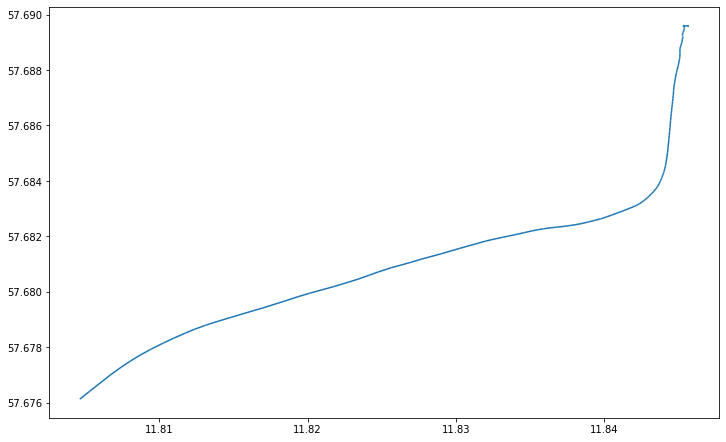

In [17]:
# Plot du premier trajectoire
trajectory.plot(figsize=(12,12))
plt.show()

In [18]:
print(trajectory)

Trajectory 210035000 (2017-07-05 17:32:18 to 2017-07-05 23:35:58) | Size: 196 | Length: 3214.0m
Bounds: (11.80462, 57.676125, 11.845715, 57.689617)
LINESTRING (11.80462 57.676125, 11.805283 57.676405, 11.805283 57.676405, 11.805283 57.676405, 11.80


Ce type de trajectoire individuelle n’est pas très informatif en tant que tel. Nous pouvons ajouter plus de contexte à notre visualisation en ajoutant une carte d'arrière-plan et en la rendant interactive. Movingpandas fournit une API facile à utiliser pour tracer la trajectoire au-dessus du fond de carte OSM avec Holoviews/Bokeh :

In [19]:
# Créer un GeoDataFrame
gdf = gpd.GeoDataFrame(trajectory.df, geometry=gpd.points_from_xy(trajectory.df.x, trajectory.df.y))
gdf.crs = "EPSG:4326"  # Définir la projection

# Créer la carte OSM
osm_map = gdf.hvplot(geo=True, tiles=True, width=800, height=600, line_color="red", project=True,title='Premier trajectoire', line_width=2, frame_width=700, frame_height=500)

# Afficher la carte
osm_map



:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]

Cette carte apporte beaucoup plus d'informations contextuelles et permet de comprendre que la trajectoire est celle d'un navire qui s'approche ou qui sort du port de Göteborg (difficile à dire à ce stade).

In [20]:
#Visualisation des propriétés des trajectoires
my_traj = collection.trajectories[0]  # 0 :le premier trajectoire
my_traj.df

,Timestamp,MMSI,NavStatus,SOG,COG,Name,ShipType,geometry,x,y,speed,direction
time,,,,,,,,,,,,
2017-07-05 17:32:18,05/07/2017 17:32:18,210035000,Under way using engine,9.8,52.8,NORDIC HAMBURG,Cargo,POINT (11.80462 57.67612),11.804620,57.676125,5.037170,51.697066
2017-07-05 17:32:28,05/07/2017 17:32:28,210035000,Under way using engine,9.8,51.0,NORDIC HAMBURG,Cargo,POINT (11.80528 57.67641),11.805283,57.676405,5.037170,51.697066
2017-07-05 17:32:36,05/07/2017 17:32:36,210035000,Under way using engine,9.8,51.0,NORDIC HAMBURG,Cargo,POINT (11.80528 57.67641),11.805283,57.676405,0.000000,0.000000
2017-07-05 17:32:38,05/07/2017 17:32:38,210035000,Under way using engine,9.8,51.0,NORDIC HAMBURG,Cargo,POINT (11.80528 57.67641),11.805283,57.676405,0.000000,0.000000
2017-07-05 17:32:48,05/07/2017 17:32:48,210035000,Under way using engine,9.7,52.0,NORDIC HAMBURG,Cargo,POINT (11.80668 57.67699),11.806675,57.676992,10.569682,51.737848
...,...,...,...,...,...,...,...,...,...,...,...,...
2017-07-05 23:08:44,05/07/2017 23:08:44,210035000,Moored,0.1,96.0,NORDIC HAMBURG,Cargo,POINT (11.84571 57.68958),11.845708,57.689578,0.000180,180.000000
2017-07-05 23:09:54,05/07/2017 23:09:54,210035000,Moored,0.1,96.0,NORDIC HAMBURG,Cargo,POINT (11.84571 57.68958),11.845708,57.689578,0.000000,0.000000
2017-07-05 23:09:57,05/07/2017 23:09:57,210035000,Moored,0.1,96.0,NORDIC HAMBURG,Cargo,POINT (11.84571 57.68958),11.845708,57.689578,0.000000,0.000000


In [21]:
#visualiser le trajectoire selon les Status des navires

# Créer un GeoDataFrame
gdf = gpd.GeoDataFrame(my_traj.df, geometry=gpd.points_from_xy(my_traj.df.x, my_traj.df.y))
gdf.crs = "EPSG:4326"  # Définir la projection

# Créer la carte OSM
osm_map = gdf.hvplot(title=f'Trajectory ID {my_traj.id}',geo=True,project=True, tiles=True, width=800, height=600, frame_width=700, frame_height=500, line_width=5.0, c='NavStatus', cmap='Dark2') 

# Afficher la carte
osm_map

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (NavStatus)

# Trouver des navires passant sous le pont d'Älvsborgsbron

In [22]:
area_of_interest = Polygon([(11.89935, 57.69270), (11.90161, 57.68902), (11.90334, 57.68967), (11.90104, 57.69354), (11.89935, 57.69270)])
intersecting = collection.get_intersecting(area_of_interest)
print(f"Found {len(intersecting)} intersections")

Found 20 intersections


In [23]:
intersecting

TrajectoryCollection with 20 trajectories

In [24]:
bridge_traj = intersecting.trajectories[0]

gdf = gpd.GeoDataFrame(bridge_traj.df, geometry=gpd.points_from_xy(bridge_traj.df.x, bridge_traj.df.y))
gdf.crs = "EPSG:4326"  # Définir la projection

# Créer la carte OSM
osm_map = gdf.hvplot(title=f'Trajectory ID {bridge_traj.id}',geo=True,project=True, tiles=True, width=800, height=600, frame_width=700, frame_height=500, line_width=5.0, c='NavStatus', cmap='Dark2') 

# Afficher la carte
osm_map

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (NavStatus)

In [25]:
bridge_traj.df.head()

,Timestamp,MMSI,NavStatus,SOG,COG,Name,ShipType,geometry,x,y
time,,,,,,,,,,
2017-07-05 01:21:57,05/07/2017 01:21:57,219011922,Under way using engine,8.8,227.7,SCANDINAVIA,Tanker,POINT (11.91230 57.69633),11.912300,57.696335
2017-07-05 01:22:47,05/07/2017 01:22:47,219011922,Under way using engine,8.7,227.1,SCANDINAVIA,Tanker,POINT (11.90947 57.69492),11.909473,57.694925
2017-07-05 01:23:06,05/07/2017 01:23:06,219011922,Under way using engine,8.7,227.5,SCANDINAVIA,Tanker,POINT (11.90842 57.69440),11.908422,57.694403
2017-07-05 01:23:18,05/07/2017 01:23:18,219011922,Under way using engine,8.7,227.4,SCANDINAVIA,Tanker,POINT (11.90775 57.69408),11.907755,57.694078
2017-07-05 01:23:47,05/07/2017 01:23:47,219011922,Under way using engine,8.7,226.8,SCANDINAVIA,Tanker,POINT (11.90618 57.69327),11.906183,57.693272


# Identifier les origines et les destinations du voyage

In [26]:
#split:fonction pour diviser les observations continues en voyages individuels
trips = mpd.ObservationGapSplitter(passenger).split(gap=timedelta(minutes=5)) 
print(f"Extrait de {len(trips)} voyages individuels à partir de {len(passenger)} traces de navires continues")

Extrait de 89 voyages individuels à partir de 14 traces de navires continues


In [27]:
gdf = gpd.GeoDataFrame(geometry=trips.to_line_gdf()['geometry'])

# Create the map with hvplot
osm_map = gdf.hvplot(geo=True, tiles=True, width=800, height=600, project=True, line_width=2,cmap='Category10')

# Show the map
osm_map

:Overlay
   .Tiles.I :Tiles   [x,y]
   .Path.I  :Path   [Longitude,Latitude]

In [28]:
origins = trips.get_start_locations()
origins.hvplot(title='Origines du voyage par type de navire', c='Name', geo=True, tiles='OSM', frame_width=700, frame_height=500)

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (Name)

In [29]:
# lorsque la vitesse passe de 0 à >0
origins.hvplot(title='Origines selon la vitesse', c='SOG', geo=True, tiles='OSM', frame_width=700, frame_height=500)

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (SOG)

Dans notre échantillon de données, les origines des déplacements peuvent être :

Lorsqu'un navire quitte son lieu d'ancrage et que la vitesse passe de 0 à >0

# Trouver des navires au départ du Sjöfartsverket (Administration maritime)

In [30]:
trips2 = mpd.ObservationGapSplitter(collection).split(gap=timedelta(minutes=5))
area_of_interest = Polygon([(11.86815, 57.68273), (11.86992, 57.68047), (11.87419, 57.68140), (11.87288, 57.68348), (11.86815, 57.68273)])

In [31]:
departures = [traj for traj in trips2 if traj.get_start_location().intersects(area_of_interest) and traj.get_length() > 100]       
print(f"Trouvé {len(departures)} départs")

Trouvé 12 départs


In [32]:
for traj in departures:
    print(f"{traj.df['ShipType'].iloc[0]}  navire  '{traj.df['Name'].iloc[0]}'  est parti à  {traj.get_start_time()}")

Law enforcement  navire  'KBV 010'  est parti à  2017-07-05 10:36:03
Law enforcement  navire  'KBV 010'  est parti à  2017-07-05 14:33:02
Law enforcement  navire  'KBV 048'  est parti à  2017-07-05 10:20:44
Pilot  navire  'PILOT 794 SE'  est parti à  2017-07-05 01:21:07
Pilot  navire  'PILOT 794 SE'  est parti à  2017-07-05 04:15:04
Pilot  navire  'PILOT 794 SE'  est parti à  2017-07-05 06:58:56
Pilot  navire  'PILOT 794 SE'  est parti à  2017-07-05 08:45:08
Pilot  navire  'PILOT 794 SE'  est parti à  2017-07-05 12:02:18
Pilot  navire  'PILOT 794 SE'  est parti à  2017-07-05 13:34:42
Pilot  navire  'PILOT 794 SE'  est parti à  2017-07-05 22:32:47
Pilot  navire  'PILOT 218 SE'  est parti à  2017-07-05 09:27:24
Pilot  navire  'PILOT 218 SE'  est parti à  2017-07-05 16:10:29


In [33]:
arrivals = [traj for traj in trips2 if traj.get_end_location().intersects(area_of_interest) and traj.get_length() > 100]
print(f"Trouvé {len(arrivals)} Arrivées")


Trouvé 12 Arrivées


In [34]:
for traj in arrivals:
    print(f"{traj.df['ShipType'].iloc[0]}  navire  '{traj.df['Name'].iloc[0]}'  est arrivée à  {traj.get_end_time()}")

Law enforcement  navire  'KBV 010'  est arrivée à  2017-07-05 10:51:03
Law enforcement  navire  'KBV 048'  est arrivée à  2017-07-05 10:26:44
Pilot  navire  'PILOT 794 SE'  est arrivée à  2017-07-05 01:37:37
Pilot  navire  'PILOT 794 SE'  est arrivée à  2017-07-05 04:51:27
Pilot  navire  'PILOT 794 SE'  est arrivée à  2017-07-05 08:16:46
Pilot  navire  'PILOT 794 SE'  est arrivée à  2017-07-05 08:55:18
Pilot  navire  'PILOT 794 SE'  est arrivée à  2017-07-05 13:06:55
Pilot  navire  'PILOT 794 SE'  est arrivée à  2017-07-05 16:44:06
Pilot  navire  'PILOT 794 SE'  est arrivée à  2017-07-05 23:58:49
Pilot  navire  'PILOT 218 SE'  est arrivée à  2017-07-05 10:08:03
Pilot  navire  'PILOT 218 SE'  est arrivée à  2017-07-05 17:46:12
Tanker  navire  'DANA'  est arrivée à  2017-07-05 08:35:48


# Clustering origins

In [35]:
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle
from shapely.geometry import MultiPoint

origins = trips2.get_start_locations()
origins['lat'] = origins.geometry.y
origins['lon'] = origins.geometry.x
matrix = origins[['lat','lon']].values

kms_per_radian = 6371.0088
epsilon = 0.1 / kms_per_radian

In [36]:
db = DBSCAN(eps=epsilon, min_samples=1, algorithm='ball_tree', metric='haversine').fit(np.radians(matrix))
cluster_labels = db.labels_
num_clusters = len(set(cluster_labels))
clusters = pd.Series([matrix[cluster_labels == n] for n in range(num_clusters)])
print(f'Number of clusters: {num_clusters}')

Number of clusters: 69


In [37]:
origins['cluster'] = cluster_labels

In [38]:
origins

,t,Timestamp,MMSI,NavStatus,SOG,COG,Name,ShipType,geometry,x,y,speed,direction,lat,lon,cluster
0,2017-07-05 17:32:18,05/07/2017 17:32:18,210035000_0,Under way using engine,9.8,52.8,NORDIC HAMBURG,Cargo,POINT (11.80462 57.67612),11.80462,57.676125,5.03717,51.697066,57.676125,11.804620,0
1,2017-07-05 10:25:53,05/07/2017 10:25:53,211483120_0,Unknown value,5.4,338.3,SY HASARDEUR,Sailing,POINT (11.81292 57.64828),11.81292,57.64828,NaN,NaN,57.648280,11.812920,1
2,2017-07-05 16:11:17,05/07/2017 16:11:17,211748480_0,Unknown value,4.6,19.5,RHE,Sailing,POINT (11.82271 57.65239),11.822708,57.652393,NaN,NaN,57.652393,11.822708,2
3,2017-07-05 02:52:29,05/07/2017 02:52:29,212048000_0,Under way using engine,9.1,51.0,ARDEA,Tanker,POINT (11.80488 57.67593),11.80488,57.675932,NaN,NaN,57.675932,11.804880,0
4,2017-07-05 03:41:59,05/07/2017 03:41:59,212636000_0,Under way using engine,10.1,51.0,HANNA,Cargo,POINT (11.80483 57.67633),11.804833,57.676333,NaN,NaN,57.676333,11.804833,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
297,2017-07-05 20:07:42,05/07/2017 20:07:42,266442000_2,Under way using engine,12.3,51.5,STENA GOTHICA,Passenger,POINT (11.80572 57.67610),11.805723,57.676098,NaN,NaN,57.676098,11.805723,0
298,2017-07-05 21:52:32,05/07/2017 21:52:32,266442000_3,Under way using engine,4.8,223.5,STENA GOTHICA,Passenger,POINT (11.91209 57.69642),11.912088,57.696415,NaN,NaN,57.696415,11.912088,5
299,2017-07-05 04:11:46,05/07/2017 04:11:46,305288000_0,Under way using engine,8.1,229.2,None,Undefined,POINT (11.90665 57.69365),11.90665,57.69365,NaN,NaN,57.693650,11.906650,57
300,2017-07-05 00:03:35,05/07/2017 00:03:35,376474000_0,Under way using engine,8.8,229.2,LARGONA,Cargo,POINT (11.91198 57.69591),11.911977,57.69591,NaN,NaN,57.695910,11.911977,5


In [39]:
origins['cluster'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68], dtype=int64)

In [40]:
def get_centermost_point(cluster):
    centroid = (MultiPoint(cluster).centroid.x, MultiPoint(cluster).centroid.y)
    centermost_point = min(cluster, key=lambda point: great_circle(point, centroid).m)
    return Point(tuple(centermost_point)[1], tuple(centermost_point)[0])
centermost_points = clusters.map(get_centermost_point)
centermost_points

0      POINT (11.80495 57.676108)
1     POINT (11.810375 57.647642)
2     POINT (11.822708 57.652393)
3     POINT (11.852167 57.688333)
4     POINT (11.868797 57.689147)
                 ...             
64     POINT (11.874843 57.69139)
65    POINT (11.805665 57.666343)
66    POINT (11.804557 57.665182)
67    POINT (11.805083 57.671162)
68    POINT (11.843242 57.691737)
Length: 69, dtype: object

In [41]:
origins.hvplot(title='Clustered origins', c='cluster', geo=True, tiles='OSM', cmap='glasbey_dark', frame_width=700, frame_height=500)

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (cluster)

In [42]:
origins_by_cluster = pd.DataFrame(origins).groupby(['cluster'])
summary = origins_by_cluster['ShipType'].unique().to_frame(name='types')
summary['n'] = origins_by_cluster.size()
summary['SOG'] = origins_by_cluster['SOG'].mean()
summary['geometry'] = centermost_points
summary = summary[summary['n']>1].sort_values(by='n', ascending=False)
summary.head()

,types,n,SOG,geometry
cluster,,,,
5,"[Tanker, Passenger, Undefined, Fishing, Cargo]",52,9.217308,POINT (11.911787 57.69663)
29,"[Passenger, Undefined, HSC]",43,0.900000,POINT (11.842308 57.661603)
0,"[Cargo, Tanker, Tug, Passenger]",28,11.946429,POINT (11.80495 57.676108)
11,"[SAR, Passenger, Undefined, HSC]",27,15.870370,POINT (11.819605 57.648238)
12,"[SAR, Passenger]",19,10.736842,POINT (11.804653 57.654408)


In [52]:
cluster_of_interest_id = 5
origins[origins['cluster']==cluster_of_interest_id].hvplot(title=f'Cluster {cluster_of_interest_id}', c='ShipType', geo=True, tiles='OSM', frame_width=700, frame_height=500)

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (ShipType)

# Analyse exploratoire avec Space Time Cube (STC)

Il est également assez simple de visualiser notre trajectoire en 3D à l'aide d'un cube spatio-temporel, dans lequel la 3ème dimension est basée sur le temps. Il existe différentes bibliothèques qui peuvent être utilisées pour tracer des données en 3D, mais nous utiliserons ici la bibliothèque plotly qui fournit une API relativement simple et directe pour générer des visualisations 3D. Pour tracer des données en 3D Modifions d'abord un peu nos informations datetime, et ne gardons que l'heure car toutes nos valeurs datent de la même date (5 juillet 2017) :

In [44]:
# Extract the time component
trajectory.df["time"] = pd.to_datetime(trajectory.df["Timestamp"]).dt.strftime("%H:%M")

# Plot the trajectory in space-time cube
fig = px.line_3d(trajectory.df, x="x", y="y", z="time", color='MMSI')
fig.update_traces(line=dict(width=5))

fig.show()

Super, nous pouvons maintenant voir notre trajectoire en 3D ! Sur la base de cette visualisation, nous pouvons déjà mieux comprendre nos données. Nous pouvons par exemple voir comment le navire s'est approché lentement du port puis a accosté vers 18h00 lorsque le mouvement s'est arrêté (c'est-à-dire que les coordonnées x/y ne changent plus). De la même manière, nous pouvons traiter toutes nos trajectoires et les tracer toutes ensemble :

In [45]:
trajectories = []

i = 0
for trajectory in collection.trajectories:
    # Calculate speed
    trajectory.add_speed(overwrite=True)

    # Determine direction of movement
    trajectory.add_direction(overwrite=True)

    # Parse time component (as datetime)
    trajectory.df["t"] = pd.to_datetime(trajectory.df["Timestamp"])

    # Add unique id for each trajectory
    trajectory.df["tid"] = i

    # Add to container
    trajectories.append(trajectory.df)
    i+=1

# Convert the list into GeoDataFrame
trajectories = pd.concat(trajectories)

# Reorder the data based on timestamp
trajectories = trajectories.sort_values(by="t").reset_index(drop=True)

# Plot them all (use trajectory id to separate trajectories)
fig = px.line_3d(trajectories, x="x", y="y", z="t", color='MMSI')
fig.update_traces(line=dict(width=5))


fig.show()

La visualisation 3D de plusieurs trajectoires peut paraître un peu brouillonne (un peu comme du spaghetty), mais nous pouvons déjà identifier certains modèles à partir des données spate-time. En regardant la façon dont les trajectoires se regroupent dans le STC, il est évident qu'il y a beaucoup d'activité tout au long de la journée. Il existe deux groupes clairs dans les données qui représentent essentiellement l'activité liée à deux ports de la région (le port de Göteborg et Saltholmens Brygga). À partir des données, vous pouvez voir comment les navires et les bateaux s'approchent régulièrement des ports en empruntant plus ou moins les mêmes itinéraires (à des moments différents). En regardant les données, nous pouvons également voir qu'un navire est resté toute la journée dans le port sans bouger nulle part (ligne verticale sans mouvement).

# Trajectoires agrégées

Comme nous pouvons le constater dans les exemples précédents, l’examen des données de mouvement en 3D à l’aide du STC peut fournir des informations intéressantes qui pourraient être difficiles à comprendre autrement. Cependant, comprendre et lire les informations demande un peu de temps et d’expérience avant de commencer à comprendre ce qui se passe dans les données. Il existe cependant d'autres astuces que nous pouvons utiliser pour abstraire nos données et les rendre plus faciles à comprendre en 2D. Movingpandas fournit un outil pratique appelé TrajectoryCollectionAggregator( voir docs ) qui peut être utilisé pour agréger les trajectoires en extrayant des clusters de points de trajectoire significatifs et en calculant les flux entre les clusters . Ces points significatifs des trajectoires incluent par exemple leurs points de départ et d'arrivée, les points de virages significatifs et les points d'arrêts significatifs, c'est-à-dire les pauses dans le mouvement (Andrienko & Andrienko, 2011). Une fois les points détectés, ils sont ensuite regroupés en fonction de leur proximité spatiale et des flux sont générés entre eux. Nous pouvons facilement agréger les données de mouvement en suivant cette approche avec movingpandas, en spécifiant les distances seuils minimales et maximales entre les points significatifs et la durée minimale (en secondes) requise pour détecter un arrêt à partir des données :



In [46]:
# Aggregate trajectories
agg = mpd.TrajectoryCollectionAggregator(collection, min_distance=500, max_distance=2000, min_stop_duration=timedelta(minutes=10))

# Get flows and clusters
flows = agg.get_flows_gdf()
clusters = agg.get_clusters_gdf()

En conséquence, nous obtenons des DataFrames contenant des informations sur le poids des flux ainsi que sur la taille du cluster :

In [47]:
flows.head()

,geometry,weight
0,"LINESTRING (11.80737 57.67704, 11.82295 57.68606)",40
1,"LINESTRING (11.82295 57.68606, 11.84298 57.68311)",41
2,"LINESTRING (11.81434 57.65202, 11.83678 57.65951)",79
3,"LINESTRING (11.83678 57.65951, 11.84298 57.68311)",9
4,"LINESTRING (11.84298 57.68311, 11.87490 57.68653)",47


In [48]:
clusters.head()


,geometry,n
0,POINT (11.80737 57.67704),104
1,POINT (11.84298 57.68311),169
2,POINT (11.81434 57.65202),131
3,POINT (11.87490 57.68653),167
4,POINT (11.91230 57.69633),0


Sur la base de ces informations, nous pouvons créer une carte interactive qui fournit une vue plus facilement compréhensible pour nos données de mouvement spatio-temporelles:

In [49]:

import holoviews as hv
from cartopy import crs as ccrs

# Assuming 'flows' and 'clusters' are GeoDataFrames
# Adjust the column names based on your actual data

# Plot generalized aggregated trajectories
flows_plot = flows.hvplot(title='Generalized aggregated trajectories', geo=True, hover_cols=['weight'], line_width='weight', alpha=0.5, color='#1f77b3', frame_height=400, frame_width=400).opts(projection=ccrs.PlateCarree())

# Plot clusters
clusters_plot = clusters.hvplot(geo=True, color='red', size='n').opts(projection=ccrs.PlateCarree())

# Overlay the two plots
osm_map = hv.Overlay([flows_plot, clusters_plot])
osm_map

:Overlay
   .Path.I   :Path   [Longitude,Latitude]   (weight)
   .Points.I :Points   [Longitude,Latitude]   (n)